# Importing libraries

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, classification_report

from sklearn.ensemble import RandomForestClassifier

# Importing the dataset

- The dataset I'm working on is the Loan Approval Classification Dataset in Group A

In [ ]:
df = pd.read_csv('/content/loan_data.csv')
df.head()

,person_age,person_gender,person_education,person_income,person_emp_exp,person_home_ownership,loan_amnt,loan_intent,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,credit_score,previous_loan_defaults_on_file,loan_status
0,22.0,female,Master,71948.0,0,RENT,35000.0,PERSONAL,16.02,0.49,3.0,561,No,1
1,21.0,female,High School,12282.0,0,OWN,1000.0,EDUCATION,11.14,0.08,2.0,504,Yes,0
2,25.0,female,High School,12438.0,3,MORTGAGE,5500.0,MEDICAL,12.87,0.44,3.0,635,No,1
3,23.0,female,Bachelor,79753.0,0,RENT,35000.0,MEDICAL,15.23,0.44,2.0,675,No,1
4,24.0,male,Master,66135.0,1,RENT,35000.0,MEDICAL,14.27,0.53,4.0,586,No,1


# Preprocessing the dataset

- Handle any missing values
- Convert categorical variables into numerical values using OneHotEncoder
- Scale the features in the dataset

In [ ]:
# Rearranges the indexing of the dataset so that the labels start from 0 instead of any other number.
X = df.drop(['loan_status'], axis=1)

# assign target variable "loan_status" to y
y = df['loan_status']

## Identifying the types of features

In [ ]:
# Sorts all the columns featuring categorical variables and assigns them
categorical_features = X.select_dtypes(include=['object']).columns
print(categorical_features)

# Sorts all the columns featuring numerical variables and assigns them
numerical_features = X.select_dtypes(include=['int64', 'float64']).columns
print(numerical_features)

Index(['person_gender', 'person_education', 'person_home_ownership',
       'loan_intent', 'previous_loan_defaults_on_file'],
      dtype='object')
Index(['person_age', 'person_income', 'person_emp_exp', 'loan_amnt',
       'loan_int_rate', 'loan_percent_income', 'cb_person_cred_hist_length',
       'credit_score'],
      dtype='object')


## Scaling the numerical features

In [ ]:
from sklearn.preprocessing import StandardScaler

# Create an instance of Standard Scaler
scaler = StandardScaler()

# Fit and transform the numerical features, resulting in normalized values with a range of 0 to 1
scaled_numerical_data = scaler.fit_transform(X[numerical_features])
print(scaled_numerical_data)

[[-0.95353824 -0.10408961 -0.89228413 ...  4.01639414 -0.73910854
  -1.41981408]
 [-1.11896309 -0.84600467 -0.89228413 ... -0.6848294  -0.99686317
  -2.5499748 ]
 [-0.45726369 -0.84406489 -0.3975175  ...  3.4430742  -0.73910854
   0.04741211]
 ...
 [ 0.8661351  -0.29068126  0.26217134 ... -1.02882137  1.06517387
   0.70171569]
 [ 0.2044357  -0.58634807 -0.23259529 ...  2.52576229  0.03415535
  -0.5672367 ]
 [-0.62268854 -0.35699428 -0.72736192 ... -0.11150946 -0.73910854
  -0.09137955]]


## Encoding categorical variables

In [ ]:
from sklearn.preprocessing import OneHotEncoder

# Create an instance of OneHotEncoder
encoder = OneHotEncoder(drop='first')

# FIt and transform the categorical features, resulting in their respective numerical representations
encoded_categorical_data = encoder.fit_transform(X[categorical_features])
print(encoded_categorical_data)

  (0, 4)	1.0
  (0, 7)	1.0
  (0, 11)	1.0
  (1, 3)	1.0
  (1, 6)	1.0
  (1, 8)	1.0
  (1, 13)	1.0
  (2, 3)	1.0
  (2, 10)	1.0
  (3, 1)	1.0
  (3, 7)	1.0
  (3, 10)	1.0
  (4, 0)	1.0
  (4, 4)	1.0
  (4, 7)	1.0
  (4, 10)	1.0
  (5, 3)	1.0
  (5, 6)	1.0
  (5, 12)	1.0
  (6, 1)	1.0
  (6, 7)	1.0
  (6, 8)	1.0
  (7, 3)	1.0
  (7, 7)	1.0
  (7, 10)	1.0
  :	:
  (44991, 0)	1.0
  (44991, 3)	1.0
  (44991, 8)	1.0
  (44992, 1)	1.0
  (44992, 7)	1.0
  (44992, 11)	1.0
  (44993, 3)	1.0
  (44993, 7)	1.0
  (44993, 11)	1.0
  (44994, 7)	1.0
  (44994, 10)	1.0
  (44995, 0)	1.0
  (44995, 7)	1.0
  (44995, 10)	1.0
  (44996, 7)	1.0
  (44996, 9)	1.0
  (44997, 0)	1.0
  (44997, 7)	1.0
  (44998, 0)	1.0
  (44998, 1)	1.0
  (44998, 7)	1.0
  (44998, 8)	1.0
  (44999, 0)	1.0
  (44999, 3)	1.0
  (44999, 7)	1.0


## The Merge

- After we are done encoding the categorical features and scaling the numerical ones, we will have to merge them together, essentially forming a new dataset which is processed and ready to work with learning models.

In [ ]:
# Concatenating both of the features
processed_data = np.hstack([scaled_numerical_data, encoded_categorical_data.toarray()])

# Converting the dataset into a dataFrame with new column names
final_columns = numerical_features.tolist() + encoder.get_feature_names_out(categorical_features).tolist()
final_df = pd.DataFrame(processed_data, columns=final_columns)

# Storing the preprocesed features for further modeling approaches
data_X = final_df.copy()
data_X.head()

,person_age,person_income,person_emp_exp,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,credit_score,person_gender_male,person_education_Bachelor,...,person_education_Master,person_home_ownership_OTHER,person_home_ownership_OWN,person_home_ownership_RENT,loan_intent_EDUCATION,loan_intent_HOMEIMPROVEMENT,loan_intent_MEDICAL,loan_intent_PERSONAL,loan_intent_VENTURE,previous_loan_defaults_on_file_Yes
0,-0.953538,-0.104090,-0.892284,4.024953,1.683039,4.016394,-0.739109,-1.419814,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
1,-1.118963,-0.846005,-0.892284,-1.359209,0.044782,-0.684829,-0.996863,-2.549975,0.0,0.0,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
2,-0.457264,-0.844065,-0.397517,-0.646600,0.625557,3.443074,-0.739109,0.047412,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,-0.788113,-0.007039,-0.892284,4.024953,1.417829,3.443074,-0.996863,0.840507,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
4,-0.622689,-0.176371,-0.727362,4.024953,1.095549,4.475050,-0.481354,-0.924130,1.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0


# Modeling

## Splitting the processed dataset

In [ ]:
X = data_X

# Splitting the data in an 8:2 ratio
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

## Bagging Approach: Extra Trees

For our bagging approach, we will be using **Extra Trees**, a variation of Random Forest but with some differences.

- In Extra Trees, the algorithm chooses the split point randomly instead of selecting the best split based on a criterion (e.g., Gini impurity or Information Gain).
- This results in increased diversity among the trees
- Unlike Random Forest, Extra Trees does not bootstrap the dataset and uses the entirety of it in its operation

In [ ]:
from sklearn.ensemble import ExtraTreesClassifier

# Initializing the ExtraTreesClassifier with n_estimators=100
extra_trees = ExtraTreesClassifier(n_estimators=100, random_state=42)

# Fitting the model on the training data
extra_trees.fit(X_train, y_train)

ExtraTreesClassifier(random_state=42)

In [ ]:
# Making predictions with the ExtraTreesClassifier
extratrees_y_pred = extra_trees.predict(X_test)

# Evaluation
extratrees_accuracy = accuracy_score(y_test, extratrees_y_pred)
print(f"Extra Trees Accuracy: {extratrees_accuracy:.2f}")

Extra Trees Accuracy: 0.92


## Boosting Approach: AdaBoost

For our boosting approach, we will be using AdaBoost, an algorithm that operates on the principle of stagewise addition where multiple weak learners are used to achieve strong learners.
In this case, the value of the alpha parameter will be indirectly proportional to the error of the weak learn

In [ ]:
from sklearn.ensemble import AdaBoostClassifier

# Initializing AdaBoostClassifier with 100 n_estimators
adaboost = AdaBoostClassifier(n_estimators=100, random_state=42)

# Training the classifier
adaboost.fit(X_train, y_train)

# Making predictions with the adaboost classifier
adaboost_y_pred = adaboost.predict(X_test)

# Evaluation
adaboost_accuracy = accuracy_score(y_test, adaboost_y_pred)
print(f"AdaBoost Accuracy: {adaboost_accuracy:.2f}")

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


AdaBoost Accuracy: 0.91


## Stacking Approach

For our stacking approach, we will be using the previous two bagging and boosting methods along with a new model called XGBoost to create the list of base learners.

In [ ]:
from sklearn.ensemble import StackingClassifier
from xgboost import XGBClassifier

'''
My stacking model uses a list of base learners - ExtraTrees, AdaBoost and XGBoost classifiers
Each with their own 100 estimators and fixed random state of 42
'''

base_learners = [('et', ExtraTreesClassifier(n_estimators=100, random_state=42)), ('adb', AdaBoostClassifier(n_estimators=100, random_state=42)), ('xgb', XGBClassifier(n_estimators=100, random_state=42))]

### Defining a Meta-Learner

In any stacking approach, the predictions of the base learners are combined and weighed against a meta learner model, resulting in a more refined and stronger prediction.
For this task, I decided to use a Decision Tree model, which is simple in its operation and can easily synthesize the info from the base learners.

In [ ]:
from sklearn.tree import DecisionTreeClassifier

# Initializing the DecisionTree metalearner
meta_learner = DecisionTreeClassifier(max_depth=5, random_state=42)

### Creating the Stacking Classifier

In [ ]:
# Initializing stacking model with the base learners as estimators and the meta learner as the final estimator
# I also used fivefold cross validation (cv = 5) to improve the robustness of the stacking model
stacking_model = StackingClassifier(estimators=base_learners, final_estimator=meta_learner,cv=5)

# Fitting the data into the model
stacking_model.fit(X_train, y_train)

# Predicting and evaluating the model
stacking_pred = stacking_model.predict(X_test)
print("Stacking Model Accuracy:", accuracy_score(y_test, stacking_pred))

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.1

Stacking Model Accuracy: 0.9317777777777778


## Voting Approach

A voting approach to ensemble learning means to combine several base models and make predictions based on voting preferences.

There are two approaches to Voting classifiers. They are -

- **Hard Voting**: With this approach, the class that receives the majority of votes is selected as the final prediction.
- **Soft Voting**: In this approach, the weighted average of the predicted probabilties is used to make the final prediction.

As per the task, I will be implementing both soft and hard voting classifiers using algorithms of my choice.


### Soft Voting

Now for my soft voting approach, I will be using these three algorithms for the estimators.
- Extra Trees
- Gradient Boosting
- Support Vector Machine

In [ ]:
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier, VotingClassifier

# Estimators that will be combined in the VotingClassifier
soft_estimators = [
        ('et', ExtraTreesClassifier(n_estimators=100, random_state=42)),
        ('gb', GradientBoostingClassifier(n_estimators=100, random_state=42)),
        ('svc', SVC(probability=True))
    ]

# Initializing the soft vote model
soft_vote_model = VotingClassifier(estimators=soft_estimators, voting='soft')

# Fitting the data in the model
soft_vote_model.fit(X_train, y_train)

# Prediction and Evaluation
soft_vote_pred = soft_vote_model.predict(X_test)
print("Soft Voting Classifier Accuracy:", accuracy_score(y_test, soft_vote_pred))

Soft Voting Classifier Accuracy: 0.9225555555555556


### Hard Voting

For my hard voting approach, I will be using these three algorithms as the estimators
- Random Forest
- XGBoost
- AdaBoost

In [ ]:
# Estimators that will be combined in the VotingClassifier
hard_estimators = [
        ('rt', RandomForestClassifier(n_estimators=100, random_state=42)),
        ('xgb', XGBClassifier(n_estimators=100, random_state=42)),
        ('adb', AdaBoostClassifier(n_estimators=100, random_state=42))
    ]

# Initializing the hard vote model
hard_vote_model = VotingClassifier(estimators=hard_estimators, voting='hard')

# Fitting the data in the model
hard_vote_model.fit(X_train, y_train)

# Prediction and Evaluation
hard_vote_pred = hard_vote_model.predict(X_test)
print("hard Voting Classifier Accuracy:", accuracy_score(y_test, hard_vote_pred))

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


hard Voting Classifier Accuracy: 0.9307777777777778


# Evaluation

To evaluate our models and compare them, we will be using three techniques.

- Cross Validation
- SHAP
- LIME

## Model Performance Comparison

In [ ]:
print(f"Extra Trees Accuracy: {extratrees_accuracy:.2f}")
print(f"AdaBoost Accuracy: {adaboost_accuracy:.2f}")
print(f"Stacking Model Accuracy: {accuracy_score(y_test, stacking_pred):.2f}")
print(f"Soft Voting Classifier Accuracy: {accuracy_score(y_test, soft_vote_pred):.2f}")
print(f"Hard Voting Classifier Accuracy: {accuracy_score(y_test, hard_vote_pred):.2f}")

Extra Trees Accuracy: 0.92
AdaBoost Accuracy: 0.91
Stacking Model Accuracy: 0.93
Soft Voting Classifier Accuracy: 0.92
Hard Voting Classifier Accuracy: 0.93


## Cross Validation

Cross Validation refers to the process of resampling and sample splitting methods that use different portions of the data to test and train a model on different iterations.

For my task, I will be using fivefold cross-validation (CV = 5). I will be cross validating all of the models I previously used on the dataset.


### Defining the models

In [ ]:
from sklearn.model_selection import cross_val_score

# Define all of the models
models = {
    "Extra Trees": ExtraTreesClassifier(n_estimators=100, random_state=42),
    "AdaBoost": AdaBoostClassifier(n_estimators=100, random_state=42),
    "Stacking": StackingClassifier(estimators=[('et', ExtraTreesClassifier(n_estimators=100, random_state=42)), ('adb', AdaBoostClassifier(n_estimators=100, random_state=42)), ('xgb', XGBClassifier(n_estimators=100, random_state=42))], final_estimator=DecisionTreeClassifier(max_depth=5, random_state=42),cv=5), "SoftVoting": VotingClassifier(estimators=[
        ('et', ExtraTreesClassifier(n_estimators=100, random_state=42)),
        ('gb', GradientBoostingClassifier(n_estimators=100, random_state=42)),
        ('svc', SVC(probability=True))
    ], voting='soft'), "HardVoting": VotingClassifier(estimators=[
        ('rt', RandomForestClassifier(n_estimators=100, random_state=42)),
        ('xgb', XGBClassifier(n_estimators=100, random_state=42)),
        ('adb', AdaBoostClassifier(n_estimators=100, random_state=42))
    ], voting='hard')
}

### Calculating the Results

In [ ]:
results = {}
for model_name, model in models.items():
    scores = cross_val_score(model, data_X, y, cv=2, scoring='accuracy')
    results[model_name] = scores
    print(f"{model_name} Cross-Validation Accuracy: {scores.mean():.4f} ± {scores.std():.4f}")

Extra Trees Cross-Validation Accuracy: 0.9094 ± 0.0023


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


AdaBoost Cross-Validation Accuracy: 0.9113 ± 0.0009


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.1

Stacking Cross-Validation Accuracy: 0.9197 ± 0.0038
SoftVoting Cross-Validation Accuracy: 0.9189 ± 0.0015


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


HardVoting Cross-Validation Accuracy: 0.9241 ± 0.0001


### Visualizing Cross Validation

#### Cross Validation Accuracy Comparison

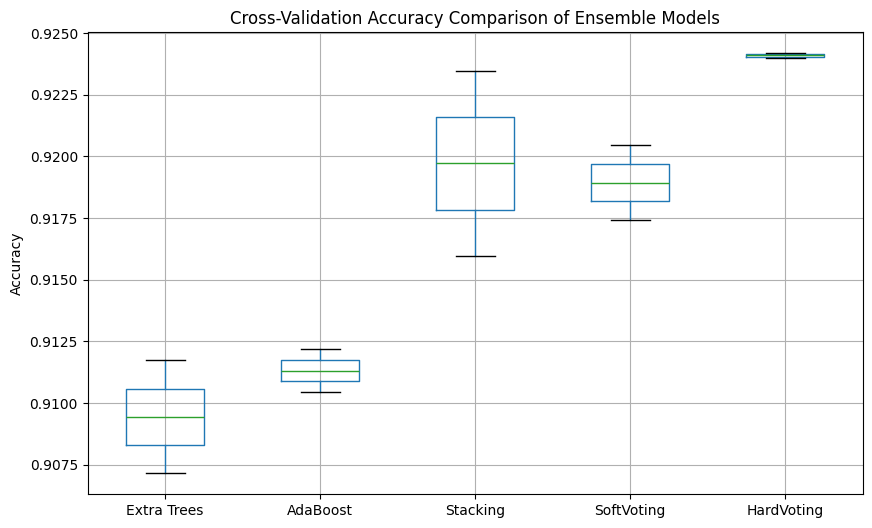

In [ ]:
# Converting results to a dataFrame
results_df = pd.DataFrame(results)

# Plotting the results
plt.figure(figsize=(10, 6))
results_df.boxplot()
plt.title("Cross-Validation Accuracy Comparison of Ensemble Models")
plt.ylabel("Accuracy")
plt.show()

#### Confusion Matrices for Each Model

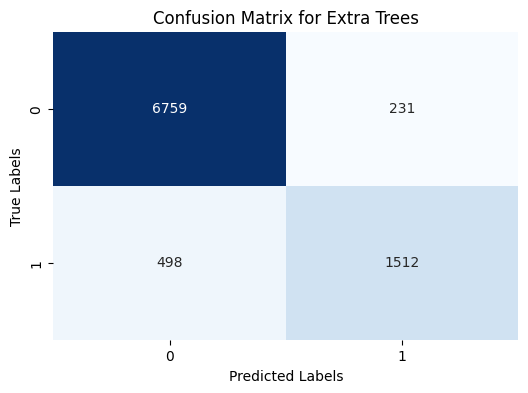

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


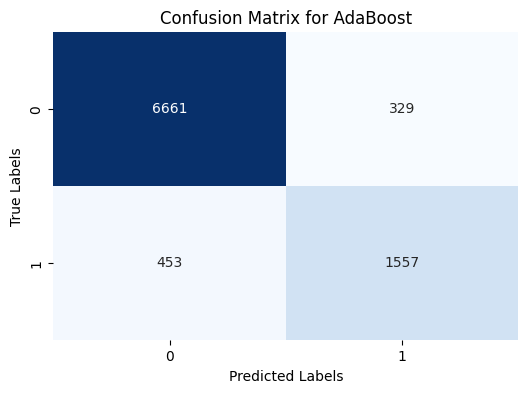

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.1

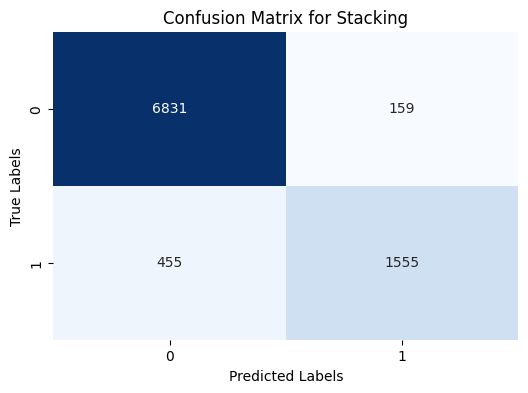

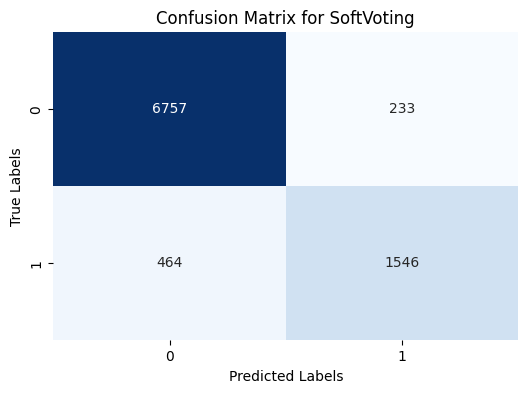

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


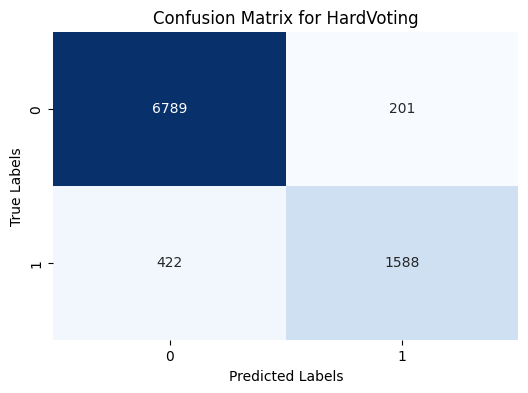

In [ ]:
from sklearn.metrics import confusion_matrix

for model_name, model in models.items():
    # Fit the model and predict on test set
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Compute confusion matrix
    cm = confusion_matrix(y_test, y_pred)

    # Plot confusion matrix
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
    plt.title(f"Confusion Matrix for {model_name}")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()

## Explainable AI (XAI)

### Explaining Predictions using SHAP

Using SHAP, we can gain detailed insights into features that directly or indirectly contribute to the individual predictions. To demonstrate its utility, I will be computing the SHAP values for one of the best performing models I have trained, the Stacking Classifier.

However, Stacking Classification models aren't directly compatible with SHAP since it's a meta-learner combining predictions from multiple base models. For this task to succeed, I will:

- Compute SHAP values for every single base learner
- Computer SHAP values for the meta learner

Explaining base learner 1


Streaming output truncated to the last 5000 lines.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:486: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:486: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:486: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:486: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:486: UserWarning: X has feature names, but ExtraTreeClassifier was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:486: UserWarning: X has feature

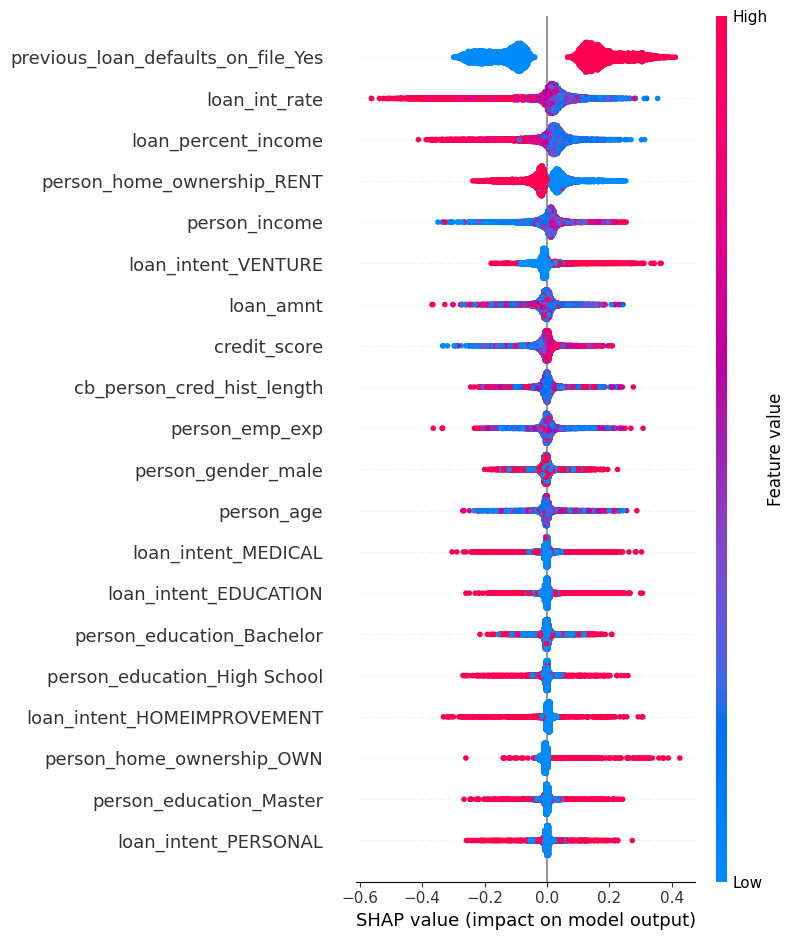

Explaining base learner 2


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:486: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:486: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:486: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:486: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:486: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:486: UserWarning: X has feature n

In [ ]:
import shap

# I will use a subset of the dataset to reduce the computational time.
# For this instance, I will sample 100 instances from the dataset
X_sample = X_test.sample(100, random_state=42)

# Explaining the base learners
# Explaining the base learners using estimators_
for idx, model in enumerate(stacking_model.estimators_):
    print(f"Explaining base learner {idx + 1}")
    # Pass the model's predict_proba method as a callable object to the Explainer
    explainer = shap.Explainer(model[1].predict_proba, X_train)
    shap_values = explainer(X_test)
    # Select SHAP values for a specific class (e.g., class 0)
    shap.summary_plot(shap_values[:,:,0], X_test) # Selecting shap values for class 0


# Extracting base predictions from the base learners
base_predictions = np.column_stack([model[1].predict_proba(X_train) for _, model in stacking_model.estimators_])

# Explaining the meta learner
meta_explainer = shap.Explainer(stacking_model.final_estimator_.predict_proba, base_predictions)  # Pass predict_proba for meta learner
meta_shap_values = meta_explainer(np.column_stack([model[1].predict_proba(X_test) for _, model in stacking_model.estimators_]))

# Select SHAP values for a specific class in meta learner (e.g., class 0)
shap.summary_plot(meta_shap_values[:,:,0], np.column_stack([model[1].predict_proba(X_test) for _, model in stacking_model.estimators_])) # Selecting shap values for class 0

### Explaining Predictions using LIME

With LIME, We can ascertain how individual predictions of models are calculated by approximating it locally with an interpretable model.

This process highlights influential features for the given predictions.

In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=411352707686b59f41a05849ba7c3b2ce76968f91a5d67889baee6a1629eea61
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


#### Explaining the base learners

1. Extra Trees
2. AdaBoost
3. XGBoost

In [ ]:
from lime.lime_tabular import LimeTabularExplainer

# Step 1: Explain Base Learners
for idx, model in enumerate(stacking_model.estimators_):
    print(f"Explaining base learner {idx + 1}")
    # Get feature names and class names as lists
    feature_names = list(X_train.columns) # Assuming X_train is a pandas DataFrame
    class_names = list(y.unique()) if hasattr(y, 'unique') else list(set(y)) # Assuming y is a pandas Series or a list-like object

    explainer = LimeTabularExplainer(
        X_train.values, # Use .values to get the underlying numpy array
        feature_names=feature_names,
        class_names=class_names,
        mode='classification'
    )
    exp = explainer.explain_instance(X_test.iloc[0].values, model.predict_proba) # Use .iloc and .values to get the first row as a numpy array
    exp.show_in_notebook()

Explaining base learner 1


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but ExtraTreesClassifier was fitted with feature names
  warnings.warn(


Explaining base learner 2


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
  warnings.warn(


Explaining base learner 3


#### Explaining the meta learner

- Decision Tree

In [ ]:
# Get predictions from base learners
base_predictions = np.column_stack([model.predict_proba(X_test) for model in stacking_model.estimators_])

classNames = list(y.unique()) if hasattr(y, 'unique') else list(set(y))

# Get the number of base learners (which should match the expected features for the meta-learner)
num_base_learners = len(stacking_model.estimators_)

# Adjust feature_names to match the number of base learners
feature_names = [name for name, _ in base_learners][:num_base_learners]

# Use LimeTabularExplainer on the meta-learner, providing the correct number of features
meta_explainer = LimeTabularExplainer(base_predictions[:, :num_base_learners],  # Use only the relevant columns
                                      feature_names=feature_names,
                                      class_names=classNames, mode='classification')
exp_meta = meta_explainer.explain_instance(base_predictions[0, :num_base_learners],  # Use only the relevant features
                                           stacking_model.final_estimator_.predict_proba)
exp_meta.show_in_notebook()

#### Stacking Classifier as a Black Box

In [ ]:
# Treat the stacking classifier as a black box
# Get the original feature names from X_train
original_feature_names = list(X_train.columns)

stacking_explainer = LimeTabularExplainer(X_train.values, # Convert X_train to a NumPy array using .values
                                      feature_names=original_feature_names,  # Use original feature names
                                      class_names=classNames,
                                      mode='classification')
exp_stacking = stacking_explainer.explain_instance(X_test.iloc[0].values, stacking_model.predict_proba) # Convert the instance to a NumPy array as well
exp_stacking.show_in_notebook()

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but ExtraTreesClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
  warnings.warn(


## Performance Analysis

I will analyze the performance of each model with the following metrics.

- Accuracy
- Precision
- Recall
- F1 Score

In [ ]:

# Collect all metrics in a DataFrame for summary
metrics_summary = []

for model_name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')

    metrics_summary.append({
        "Model": model_name,
        "Accuracy": accuracy,
        "Precision": precision,
        "Recall": recall,
        "F1 Score": f1
    })

metrics_df = pd.DataFrame(metrics_summary)

# Display the summary
print("Model Performance Summary:")
print(metrics_df)

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.1

Model Performance Summary:
         Model  Accuracy  Precision    Recall  F1 Score
0  Extra Trees  0.919000   0.917104  0.919000  0.916878
1     AdaBoost  0.913111   0.911585  0.913111  0.912110
2     Stacking  0.931778   0.930781  0.931778  0.929774
3   SoftVoting  0.922556   0.920843  0.922556  0.920824
4   HardVoting  0.930778   0.929456  0.930778  0.929303
